# Community Detection - Lab

## Introduction

In this lab, you'll once again work to cluster a network dataset. This time, you'll be investigating a meetup dataset for events occurring in Nashville.

## Objectives

You will be able to:
* Cluster a social network into subgroups

## Load the Dataset

To start, load the dataset `'nashville-meetup/group-edges.csv'` as a pandas Dataframe. 

In [1]:
#Your code here
import pandas as pd
data= pd.read_csv('nashville-meetup/group-edges.csv', index_col=0)
data.head()

,group1,group2,weight
0,19292162,535553,2
1,19292162,19194894,1
2,19292162,19728145,1
3,19292162,18850080,2
4,19292162,1728035,1


To add some descriptive data, import the file `'nashville-meetup/meta-groups.csv'`.

In [2]:
#Your code here
meta = pd.read_csv('nashville-meetup/meta-groups.csv')
meta.head()

,group_id,group_name,num_members,category_id,category_name,organizer_id,group_urlname
0,339011,Nashville Hiking Meetup,15838,23,Outdoors & Adventure,4353803,nashville-hiking
1,19728145,Stepping Out Social Dance Meetup,1778,5,Dancing,118484462,steppingoutsocialdance
2,6335372,Nashville soccer,2869,32,Sports & Recreation,108448302,Nashville-soccer
3,10016242,NashJS,1975,34,Tech,8111102,nashjs
4,21174496,20's & 30's Women looking for girlfriends,2782,31,Socializing,184580248,new-friends-in-Nashville


## Transform to a Network Representation

Take the Pandas DataFrame and transform it into a graph representation via NetworkX. Make nodes the names of the various groups within the Nashville area. The edges should be the weights between these groups.

In [3]:
#Your code here
import networkx as nx
groups_dict = dict(zip(meta.group_id, meta.group_name))
G = nx.Graph()
for row in data.index:
    g1 = groups_dict[data.group1[row]]
    g2 = groups_dict[data.group2[row]]
    weight = data.weight[row]
    G.add_edge(g1,g2,weight=weight)

## Visualize the Network

/Users/feraguilari/anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


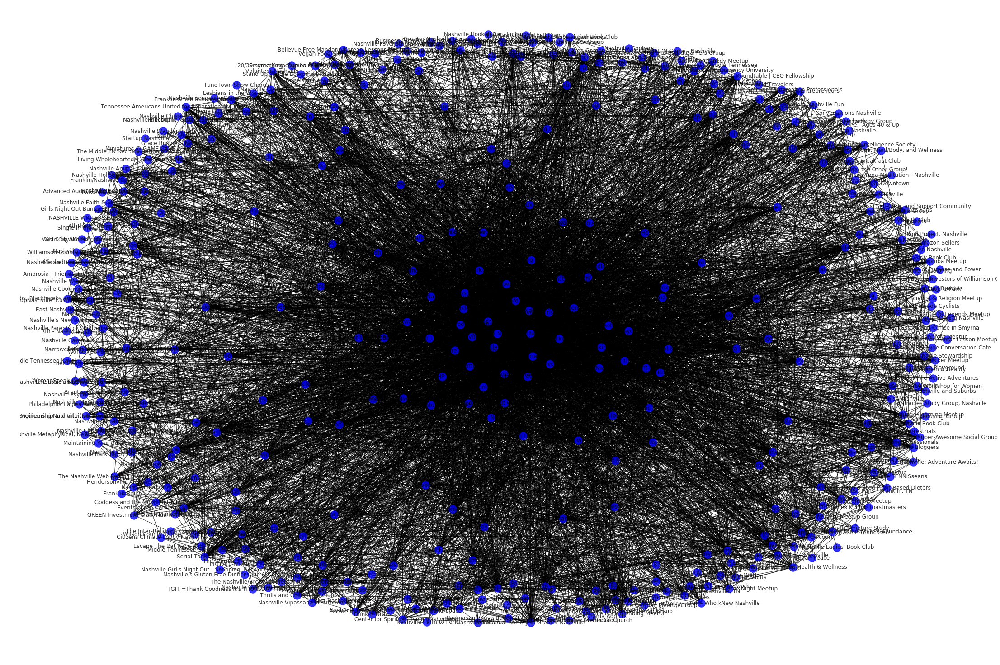

In [4]:
#Your code here
import matplotlib.pyplot as plt
%matplotlib inline

plt.figure(figsize=(30,20))
nx.draw(G, pos=nx.spring_layout(G,k=2, seed=5), with_labels=True, node_color='b', alpha=.8)

## Refine the Visual

As you should see, the initial visualization is a globular mess! Refine the visualization to better picture the center core of the  network.

In [5]:
#Your code here
for i in range(0,100,5):
    print(f'{i}th percentile: {data.weight.quantile(q=i/100)}')

0th percentile: 1.0
5th percentile: 1.0
10th percentile: 1.0
15th percentile: 1.0
20th percentile: 1.0
25th percentile: 1.0
30th percentile: 1.0
35th percentile: 1.0
40th percentile: 1.0
45th percentile: 1.0
50th percentile: 1.0
55th percentile: 1.0
60th percentile: 1.0
65th percentile: 1.0
70th percentile: 2.0
75th percentile: 2.0
80th percentile: 2.0
85th percentile: 3.0
90th percentile: 4.0
95th percentile: 7.0


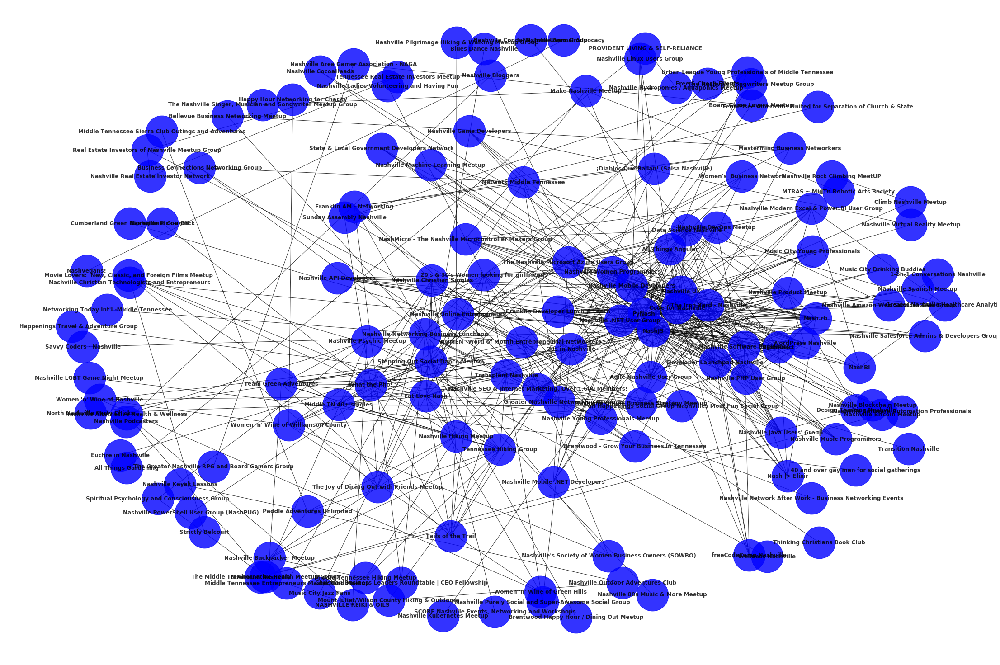

In [6]:
threshold=5
G_subset = nx.Graph()
for row in data.index:
    g1 = groups_dict[data.group1[row]]
    g2 = groups_dict[data.group2[row]]
    weight = data.weight[row]
    if weight > threshold:
        G_subset.add_edge(g1,g2,weight=weight)

plt.figure(figsize=(30,20))
nx.draw(G_subset, pos=nx.spring_layout(G_subset,k=2, seed=5), with_labels=True, node_color='b', alpha=.8,
       node_size=5000, font_size=12, font_weight='bold')

In [7]:
len(G_subset)

146

## Try Clustering the Network

Now, that the dataset is a little more manageable, try clustering the remaining group nodes.

In [8]:
#Your code here
gn_clusters = list(nx.algorithms.community.centrality.girvan_newman(G_subset))
for n, clusters in enumerate(gn_clusters):
    print(f'After removing {n} edges, there are {len(clusters)}')

After removing 0 edges, there are 7
After removing 1 edges, there are 8
After removing 2 edges, there are 9
After removing 3 edges, there are 10
After removing 4 edges, there are 11
After removing 5 edges, there are 12
After removing 6 edges, there are 13
After removing 7 edges, there are 14
After removing 8 edges, there are 15
After removing 9 edges, there are 16
After removing 10 edges, there are 17
After removing 11 edges, there are 18
After removing 12 edges, there are 19
After removing 13 edges, there are 20
After removing 14 edges, there are 21
After removing 15 edges, there are 22
After removing 16 edges, there are 23
After removing 17 edges, there are 24
After removing 18 edges, there are 25
After removing 19 edges, there are 26
After removing 20 edges, there are 27
After removing 21 edges, there are 28
After removing 22 edges, there are 29
After removing 23 edges, there are 30
After removing 24 edges, there are 31
After removing 25 edges, there are 32
After removing 26 edges, 

## Determine An Optimal Clustering Schema

Finally, determine a final clustering organization.

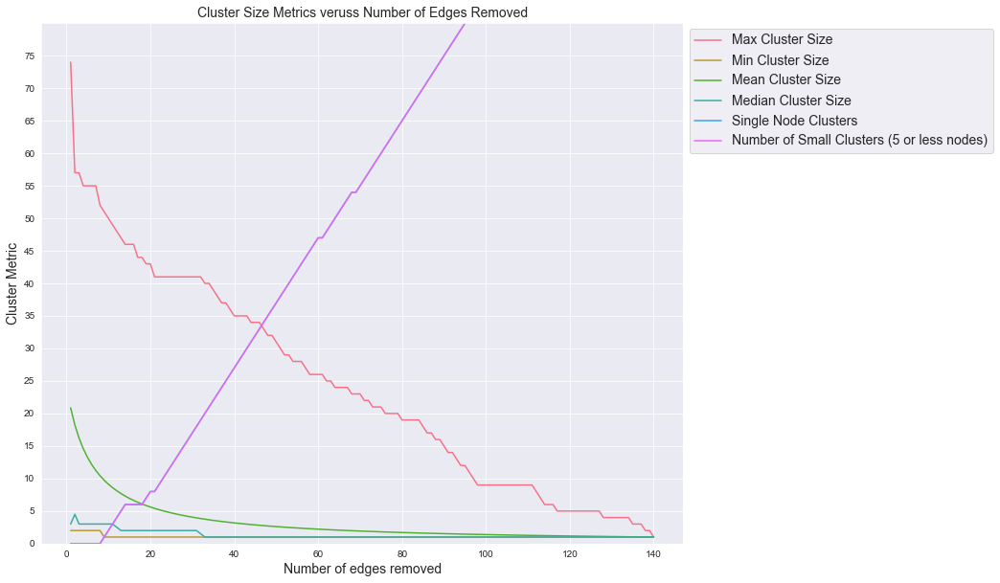

In [29]:
#Your code here
import numpy as np
import seaborn as sns
sns.set_style('darkgrid')
colors = sns.color_palette("husl", 6)

fig = plt.figure(figsize=(12,10))
x = [n+1 for n in range(len(gn_clusters))]

max_cluster_size = [max([len(c) for c in cluster]) for cluster in gn_clusters]
plt.plot(x, max_cluster_size,color=colors[0], label='Max Cluster Size')

min_cluster_size = [min([len(c) for c in cluster])for cluster in gn_clusters]
plt.plot(x, min_cluster_size,color=colors[1], label='Min Cluster Size')

mean_cluster_size = [np.mean([len(c) for c in cluster]) for cluster in gn_clusters]
plt.plot(x, mean_cluster_size,color=colors[2], label='Mean Cluster Size')

median_cluster_size = [np.median([len(c) for c in cluster]) for cluster in gn_clusters]
plt.plot(x, median_cluster_size,color=colors[3], label='Median Cluster Size')

single_node_clusters = [sum([1 if len(c)==1 else 0 for c in cluster]) for cluster in gn_clusters]
plt.plot(x, single_node_clusters,color=colors[4], label='Single Node Clusters')

small_clusters = [sum([1 if len(c)==1 else 0 for c in cluster]) for cluster in gn_clusters]
plt.plot(x,small_clusters, color=colors[5], label='Number of Small Clusters (5 or less nodes)')

plt.legend(loc=(1.01,.75), fontsize=14)
plt.title('Cluster Size Metrics veruss Number of Edges Removed', fontsize=14)
plt.xlabel('Number of edges removed', fontsize=14)
plt.ylabel('Cluster Metric', fontsize=14)
plt.ylim(0,80)
plt.yticks(ticks=list(range(0,80,5)))
plt.show()

## Visualize the Clusters

Analyze the output of your clustering schema. Do any clusters of groups stand out to you?

In [38]:
sns.color_palette('husl',21).as_hex()

['#f77189',
 '#f77553',
 '#df8732',
 '#c69432',
 '#b19b32',
 '#9da231',
 '#82a931',
 '#50b131',
 '#33b16c',
 '#34af8a',
 '#35ad9c',
 '#36acab',
 '#37aabb',
 '#39a8cd',
 '#3ba3ec',
 '#8197f4',
 '#ae88f4',
 '#d475f4',
 '#f45deb',
 '#f566c9',
 '#f66cac']

/Users/feraguilari/anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):
/Users/feraguilari/anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):
/Users/feraguilari/anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):
/Users/feraguilari/anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):
/Users/feraguilari/anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):
/Users/feraguilari/anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: Matplotli

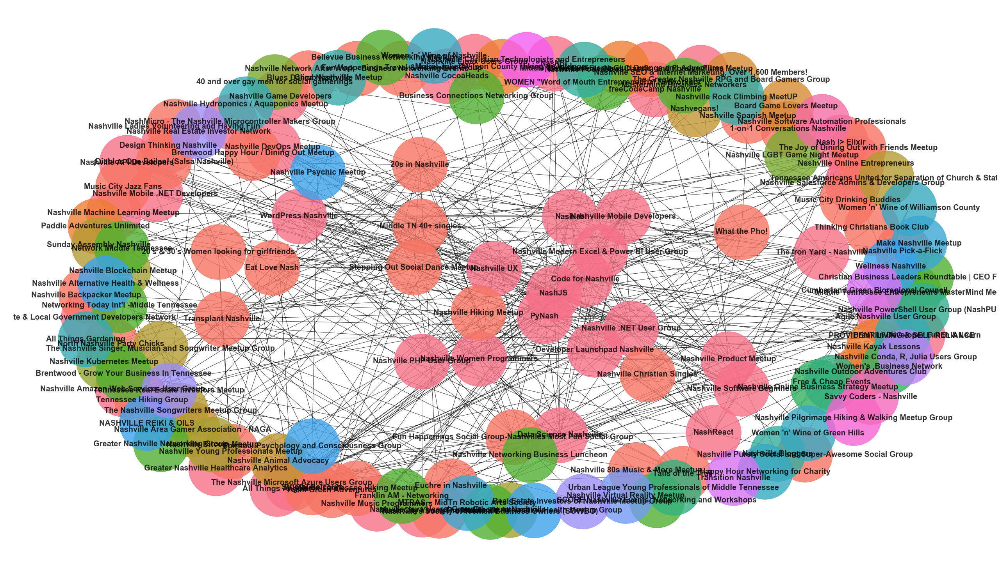

In [55]:
#Your code here
def plot_girvan_newman(G, clusters):
    fig = plt.figure(figsize=(35,20))
    colors = sns.color_palette('husl',27).as_hex()
    for n, c in enumerate(clusters):
        ci = G.subgraph(c)
        nx.draw(ci, pos=nx.spring_layout(G_subset, k=3.6, seed=3), with_labels=True, node_color=colors[n],
                alpha=.8, node_size=20000, font_weight="bold", font_size=20)
    plt.show()
        
sns.set_style('white')
plot_girvan_newman(G_subset, gn_clusters[20])

In [70]:
#Because the Network is still dense and names are long, organizing the clusters as a Pandas dataframe is appropriate
clusters = pd.DataFrame(list(gn_clusters[20])).transpose()
clusters.columns = ["Cluster{}".format(i) for i in range(1,len(clusters.columns)+1)]
clusters

#Many of the clusters are easily identifiable;
#You can see that cluster 1 is a technology group,
#cluster 2 is a social hodgepodge,
#cluster3 is outdoor enthusiasts,
#cluster4 is gamers, and so forth

,Cluster1,Cluster2,Cluster3,Cluster4,Cluster5,Cluster6,Cluster7,Cluster8,Cluster9,Cluster10,...,Cluster18,Cluster19,Cluster20,Cluster21,Cluster22,Cluster23,Cluster24,Cluster25,Cluster26,Cluster27
0,The Nashville Microsoft Azure Users Group,Nashville Spanish Meetup,Nashville Kayak Lessons,Board Game Lovers Meetup,Nashville Animal Advocacy,"The Nashville Singer, Musician and Songwriter ...",Nashville Blockchain Meetup,Nashville Kubernetes Meetup,40 and over gay men for social gatherings,Network Middle Tennessee,...,Make Nashville Meetup,Nashville Psychic Meetup,Nashville Virtual Reality Meetup,Tennessee Real Estate Investors Meetup,"Nashville Conda, R, Julia Users Group",Cumberland Green Bioregional Council,Nashville Christian Technologists and Entrepre...,Nashville Pilgrimage Hiking & Walking Meetup G...,Savvy Coders - Nashville,Nashville Software Automation Professionals
1,"Nashville SEO & Internet Marketing, Over 1,600...",What the Pho!,Paddle Adventures Unlimited,Nashville Area Gamer Association - NAGA,Nashvegans!,The Nashville Songwriters Meetup Group,Nashville Bitcoin Meetup,None,Nashville LGBT Game Night Meetup,"SCORE Nashville Events, Networking and Workshops",...,MTRAS ~ MidTn Robotic Arts Society,Wellness Nashville,None,Real Estate Investors of Nashville Meetup Group,None,Transition Nashville,None,None,None,None
2,Nashville Modern Excel & Power BI User Group,Music City Young Professionals,Nashville Outdoor Adventures Club,The Greater Nashville RPG and Board Gamers Group,None,Sunday Assembly Nashville,Ethereum Nashville,None,None,Nashville Networking Business Luncheon,...,None,The Middle TN Alternative Health Meetup Group,None,Nashville Real Estate Investor Network,None,None,None,None,None,None
3,Nashville .NET User Group,Eat Love Nash,Middle Tennessee Sierra Club Outings and Adven...,None,None,Tennessee Americans United for Separation of C...,None,None,None,Franklin AM - Networking,...,None,Spiritual Psychology and Consciousness Group,None,None,None,None,None,None,None,None
4,NashMicro - The Nashville Microcontroller Make...,1-on-1 Conversations Nashville,Mount Juliet/Wilson County Hiking & Outdoors,None,None,None,None,None,None,Christian Business Leaders Roundtable | CEO Fe...,...,None,NASHVILLE REIKI & OILS,None,None,None,None,None,None,None,None
5,freeCodeCamp Nashville,Blues Dance Nashville,None,None,None,None,None,None,None,Bellevue Business Networking Meetup,...,None,Nashville Alternative Health & Wellness,None,None,None,None,None,None,None,None
6,Franklin Developer Lunch & Learn,Nashville Network After Work - Business Networ...,None,None,None,None,None,None,None,Networking Today Int'l -Middle Tennessee,...,None,None,None,None,None,None,None,None,None,None
7,Nashville Amazon Web Services User Group,Nashville Young Professionals Meetup,None,None,None,None,None,None,None,Business Connections Networking Group,...,None,None,None,None,None,None,None,None,None,None
8,Code for Nashville,20s in Nashville,None,None,None,None,None,None,None,Brentwood - Grow Your Business In Tennessee,...,None,None,None,None,None,None,None,None,None,None
9,NashReact,¡Diablos Que Bailan! (Salsa Nashville),None,None,None,None,None,None,None,Nashville's Society of Women Business Owners (...,...,None,None,None,None,None,None,None,None,None,None


## Summary

In this lab, you got another chance to practice your network clustering skills, investigating a meetup dataset of events and groups surrounding the Nashville area. If you're up for the challenge, feel free to continue investigating the dataset and trying to cluster users or events!                                                                                                                                                               